In [1]:
from anomalib.data import MVTec, PredictDataset
from anomalib.models import Patchcore
from anomalib.engine import Engine
from anomalib.models import EfficientAd
from anomalib.utils.post_processing import superimpose_anomaly_map

import torch
from torchvision.transforms.v2 import Compose
from torchvision.transforms.v2 import Resize
from torchvision.transforms.functional import InterpolationMode
from torchvision.transforms.v2._geometry import CenterCrop
from torchvision.transforms.v2._misc import Normalize
from lightning.pytorch.callbacks import EarlyStopping, ModelCheckpoint

torch.serialization.add_safe_globals([Compose])
torch.serialization.add_safe_globals([Resize])
torch.serialization.add_safe_globals([InterpolationMode])
torch.serialization.add_safe_globals([CenterCrop])
torch.serialization.add_safe_globals([Normalize])

from matplotlib import pyplot as plt
%matplotlib inline

from pathlib import Path
from PIL import Image
import numpy as np

import cv2

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
# Mention global variables here

categories = ["leather", "tile", "grid"]

dataset_root = Path.cwd().parent.parent.parent / "datasets" / "MVTec"

In [ ]:
# Making datamodules for each category

datamodules = []

for c in categories:
    datamodule = MVTec(
        root=dataset_root,
        category=c,
        train_batch_size=32,
        eval_batch_size=32,
        num_workers=0,
    )
    datamodules.append(datamodule)

In [ ]:
# Seeing definition of Patchcore

Patchcore??

Init signature:
Patchcore(
    backbone: str = 'wide_resnet50_2',
    layers: collections.abc.Sequence[str] = ('layer2', 'layer3'),
    pre_trained: bool = True,
    coreset_sampling_ratio: float = 0.1,
    num_neighbors: int = 9,
) -> None
Source:        
class Patchcore(MemoryBankMixin, AnomalyModule):
    """PatchcoreLightning Module to train PatchCore algorithm.

    Args:
        backbone (str): Backbone CNN network
            Defaults to ``wide_resnet50_2``.
        layers (list[str]): Layers to extract features from the backbone CNN
            Defaults to ``["layer2", "layer3"]``.
        pre_trained (bool, optional): Boolean to check whether to use a pre_trained backbone.
            Defaults to ``True``.
        coreset_sampling_ratio (float, optional): Coreset sampling ratio to subsample embedding.
            Defaults to ``0.1``.
        num_neighbors (int, optional): Number of nearest neighbors.
            Defaults to ``9``.
    """

    def __init__(
        self,
     

In [ ]:
# Defining the patchcore model and one for each category
P_models = []
patchcore_model = Patchcore(
    backbone="wide_resnet50_2",  # Feature extraction backbone
    layers=["layer2", "layer3"],  # Layers to extract features from
    pre_trained=True,  # Use pretrained weights
    num_neighbors=9, # Number of nearest neighbors
    coreset_sampling_ratio=0.1  
)
for i in range(0, len(categories)):
    P_models.append(patchcore_model)

INFO:anomalib.models.components.base.anomaly_module:Initializing Patchcore model.
INFO:timm.models._builder:Loading pretrained weights from Hugging Face hub (timm/wide_resnet50_2.racm_in1k)
INFO:timm.models._hub:[timm/wide_resnet50_2.racm_in1k] Safe alternative available for 'pytorch_model.bin' (as 'model.safetensors'). Loading weights using safetensors.
INFO:timm.models._builder:Missing keys (fc.weight, fc.bias) discovered while loading pretrained weights. This is expected if model is being adapted.


In [ ]:
# Defining callbacks to save the best checkpoint

callbacks = [
    
    EarlyStopping(
        monitor="pixel_AUROC",
        mode="max",
        patience=3,
    ),
    ModelCheckpoint(
        dirpath="Assignment-2/checkpoints/PatchCore",
        filename="best",
        monitor="pixel_AUROC"
    )
]

In [ ]:
# One engine for each category for the patchcore models

patchcore_engines = []

for i in range(0, len(categories)):
    patchcore_engine = Engine(
        callbacks=callbacks,
        accelerator="auto",  # \<"cpu", "gpu", "tpu", "ipu", "hpu", "auto">,
        devices=1,
        logger=False
    )
    patchcore_engines.append(patchcore_engine)

#### Training the patchcore models on the 3 categories 

In [61]:
for i in range(0, len(categories)):
    print(f"For Category: {categories[i]} - PatchCore model")
    patchcore_engines[i].fit(datamodule=datamodules[i], model=P_models[i])

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
INFO:anomalib.data.image.mvtec:Found the dataset.

  | Name                  | Type                     | Params | Mode 
---------------------------------------------------------------------------
0 | model                 | PatchcoreModel           | 24.9 M | train
1 | _transform            | Compose                  | 0      | train
2 | normalization_metrics | MetricCollection         | 0      | train
3 | image_threshold       | F1AdaptiveThreshold      | 0      | train
4 | pixel_threshold       | F1AdaptiveThreshold      | 0      | train
5 | image_metrics         | AnomalibMetricCollection | 0      | train
6 | pixel_metrics         | AnomalibMetricCollection | 0      | train
---------------------------------------------------------------------------
24.9 M    Trainable params
0         Non-trainable params
24.9 M    Total params
99.450    Total estimated model params si

For Category: leather - PatchCore model
Epoch 0: 100%|██████████| 8/8 [00:14<00:00,  0.57it/s]

INFO:anomalib.models.image.patchcore.lightning_model:Aggregating the embedding extracted from the training set.
INFO:anomalib.models.image.patchcore.lightning_model:Applying core-set subsampling to get the embedding.

















































































































































































































































































































































































































































































































































































































































































































































































































Epoch 0: 100%|██████████| 8/8 [05:42<00:00,  0.02it/s, pixel_AUROC=0.500, pixel_F1Score=0.0163]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 8/8 [05:43<00:00,  0.02it/s, pixel_AUROC=0.500, pixel_F1Score=0.0163]

INFO:anomalib.callbacks.timer:Training took 343.54 seconds



For Category: tile - PatchCore model


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
INFO:anomalib.data.image.mvtec:Found the dataset.

  | Name                  | Type                     | Params | Mode 
---------------------------------------------------------------------------
0 | model                 | PatchcoreModel           | 24.9 M | train
1 | _transform            | Compose                  | 0      | train
2 | normalization_metrics | MetricCollection         | 0      | train
3 | image_threshold       | F1AdaptiveThreshold      | 0      | train
4 | pixel_threshold       | F1AdaptiveThreshold      | 0      | train
5 | image_metrics         | AnomalibMetricCollection | 0      | train
6 | pixel_metrics         | AnomalibMetricCollection | 0      | train
---------------------------------------------------------------------------
24.9 M    Trainable params
0         Non-trainable params
24.9 M    Total params
99.450    Total estimated model params si

Epoch 0: 100%|██████████| 8/8 [01:16<00:00,  0.10it/s, pixel_AUROC=0.500, pixel_F1Score=0.000]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 8/8 [01:17<00:00,  0.10it/s, pixel_AUROC=0.500, pixel_F1Score=0.000]

INFO:anomalib.callbacks.timer:Training took 77.90 seconds



For Category: grid - PatchCore model


GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
INFO:anomalib.data.image.mvtec:Found the dataset.

  | Name                  | Type                     | Params | Mode 
---------------------------------------------------------------------------
0 | model                 | PatchcoreModel           | 24.9 M | train
1 | _transform            | Compose                  | 0      | train
2 | normalization_metrics | MetricCollection         | 0      | train
3 | image_threshold       | F1AdaptiveThreshold      | 0      | train
4 | pixel_threshold       | F1AdaptiveThreshold      | 0      | train
5 | image_metrics         | AnomalibMetricCollection | 0      | train
6 | pixel_metrics         | AnomalibMetricCollection | 0      | train
---------------------------------------------------------------------------
24.9 M    Trainable params
0         Non-trainable params
24.9 M    Total params
99.450    Total estimated model params si

Epoch 0: 100%|██████████| 9/9 [00:56<00:00,  0.16it/s, pixel_AUROC=0.500, pixel_F1Score=0.000]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 9/9 [00:59<00:00,  0.15it/s, pixel_AUROC=0.500, pixel_F1Score=0.000]

INFO:anomalib.callbacks.timer:Training took 59.59 seconds


#### Testing the patchcore models

In [62]:
for i in range(0, len(categories)):
    patchcore_engines[i].test(datamodule=datamodules[i], model=P_models[i])


INFO:anomalib.data.image.mvtec:Found the dataset.


Testing DataLoader 0: 100%|██████████| 4/4 [01:15<00:00,  0.05it/s]

INFO:anomalib.callbacks.timer:Testing took 77.18112993240356 seconds
Throughput (batch_size=32) : 1.6066103218312706 FPS


Testing DataLoader 0: 100%|██████████| 4/4 [01:15<00:00,  0.05it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.5760869383811951     │
│       image_F1Score       │    0.0833333358168602     │
│        pixel_AUROC        │    0.9788506031036377     │
│       pixel_F1Score       │    0.24433133006095886    │
└───────────────────────────┴───────────────────────────┘

INFO:anomalib.data.image.mvtec:Found the dataset.


Testing DataLoader 0: 100%|██████████| 4/4 [00:50<00:00,  0.08it/s]

INFO:anomalib.callbacks.timer:Testing took 51.60825490951538 seconds
Throughput (batch_size=32) : 2.2670791757081457 FPS


Testing DataLoader 0: 100%|██████████| 4/4 [00:50<00:00,  0.08it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.6547619104385376     │
│       image_F1Score       │    0.09090909361839294    │
│        pixel_AUROC        │    0.7723051309585571     │
│       pixel_F1Score       │    0.23172399401664734    │
└───────────────────────────┴───────────────────────────┘

INFO:anomalib.data.image.mvtec:Found the dataset.


Testing DataLoader 0: 100%|██████████| 3/3 [00:46<00:00,  0.06it/s]

INFO:anomalib.callbacks.timer:Testing took 47.51921796798706 seconds
Throughput (batch_size=32) : 1.6414411544513918 FPS


Testing DataLoader 0: 100%|██████████| 3/3 [00:46<00:00,  0.06it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │     0.712614893913269     │
│       image_F1Score       │    0.8571428656578064     │
│        pixel_AUROC        │    0.3626353144645691     │
│       pixel_F1Score       │   0.017020219936966896    │
└───────────────────────────┴───────────────────────────┘

#### Above we can see the AUROC score for each model in the appropriate category: Leather, Tile, Grid (Top - bottom)

## Leather

In [63]:
data_path_leather = dataset_root / f"leather/test/fold/000.png"
predictions_leather = patchcore_engines[0].predict(model=P_models[0], data_path=data_path_leather)
prediction_leather = predictions_leather[0]  # Get the first and only prediction

INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


In [64]:
print(
    f"Image Shape: {prediction_leather.get("image").shape},\n"
    f"Anomaly Map Shape: {prediction_leather.get("anomaly_maps").shape}, \n"
    f"Predicted Mask Shape: {prediction_leather.get("pred_masks").shape}",
)
print(prediction_leather.keys())

Image Shape: torch.Size([1, 3, 224, 224]),
Anomaly Map Shape: torch.Size([1, 1, 224, 224]), 
Predicted Mask Shape: torch.Size([1, 1, 224, 224])
dict_keys(['image', 'image_path', 'anomaly_maps', 'pred_scores', 'pred_labels', 'pred_masks', 'pred_boxes', 'box_scores', 'box_labels'])


In [65]:
image_path = prediction_leather.get("image_path")[0]
image_size = prediction_leather.get("image").shape[-2:]
image = np.array(Image.open(image_path).resize(image_size))

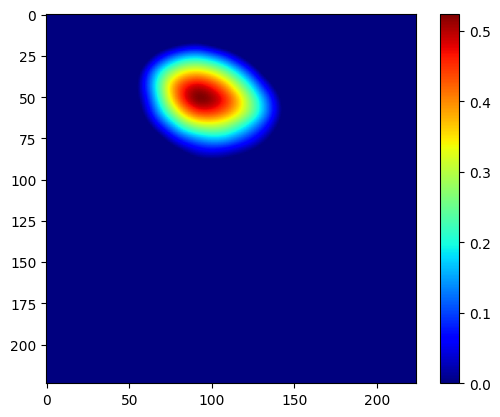

In [66]:
%matplotlib inline
anomaly_map = prediction_leather.get("anomaly_maps")[0]
anomaly_map = anomaly_map.cpu().numpy().squeeze()
plt.imshow(anomaly_map, cmap="jet")  # Use "jet" colormap for better visualization
plt.colorbar()  # Optional: Adds a color scale
plt.show()  # Displays the image properly

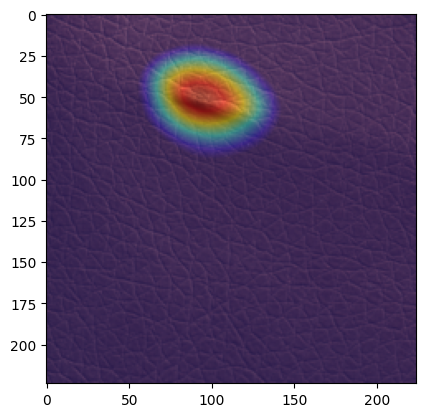

In [67]:
heat_map = superimpose_anomaly_map(anomaly_map=anomaly_map, image=image, normalize=True)
plt.imshow(heat_map)

In [68]:
pred_score = prediction_leather.get("pred_scores")[0]
pred_labels = prediction_leather.get("pred_labels")[0]
print(pred_score, pred_labels)

tensor(0.) tensor(False)


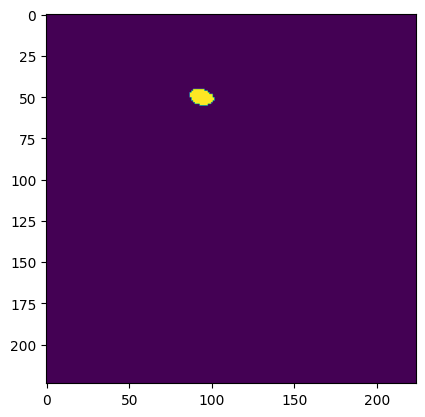

In [69]:
pred_masks = prediction_leather.get("pred_masks")[0].squeeze().cpu().numpy()
plt.imshow(pred_masks)

## Tile

In [70]:
data_path_tile = dataset_root / f"tile/test/crack/000.png"
predictions_tile = patchcore_engines[1].predict(model=P_models[1], data_path=data_path_tile)
prediction_tile = predictions_tile[0]  # Get the first and only prediction

INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]


In [71]:
print(
    f"Image Shape: {prediction_tile.get("image").shape},\n"
    f"Anomaly Map Shape: {prediction_tile.get("anomaly_maps").shape}, \n"
    f"Predicted Mask Shape: {prediction_tile.get("pred_masks").shape}",
)

Image Shape: torch.Size([1, 3, 224, 224]),
Anomaly Map Shape: torch.Size([1, 1, 224, 224]), 
Predicted Mask Shape: torch.Size([1, 1, 224, 224])


In [72]:
image_path = prediction_tile.get("image_path")[0]
image_size = prediction_tile.get("image").shape[-2:]
image = np.array(Image.open(image_path).resize(image_size))

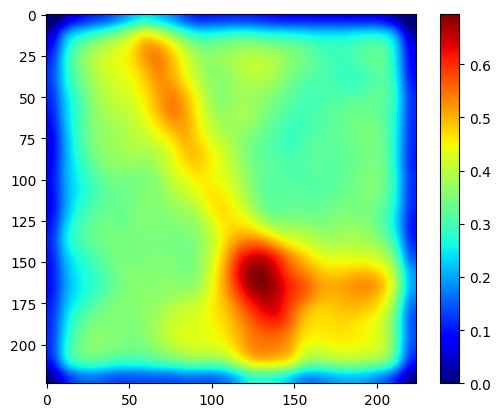

In [73]:
%matplotlib inline
anomaly_map = prediction_tile.get("anomaly_maps")[0]
anomaly_map = anomaly_map.cpu().numpy().squeeze()
plt.imshow(anomaly_map, cmap="jet")  # Use "jet" colormap for better visualization
plt.colorbar()  # Optional: Adds a color scale
plt.show()  # Displays the image properly

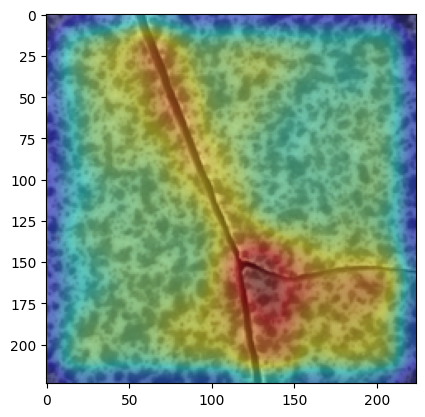

In [74]:
heat_map = superimpose_anomaly_map(anomaly_map=anomaly_map, image=image, normalize=True)
plt.imshow(heat_map)

In [75]:
pred_score = prediction_tile.get("pred_scores")[0]
pred_labels = prediction_tile.get("pred_labels")[0]
print(pred_score, pred_labels)

tensor(0.2368) tensor(False)


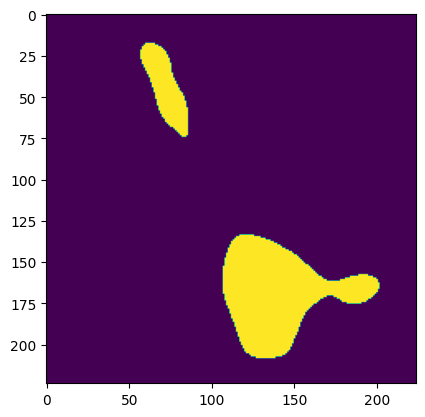

In [76]:
pred_masks = prediction_tile.get("pred_masks")[0].squeeze().cpu().numpy()
plt.imshow(pred_masks)

## Grid

In [77]:
data_path_grid = dataset_root / f"grid/test/broken/000.png"
predictions_grids = patchcore_engines[2].predict(model=P_models[2], data_path=data_path_grid)
prediction_grid = predictions_grids[0]  # Get the first and only prediction

INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]


In [78]:
print(
    f"Image Shape: {prediction_grid.get("image").shape},\n"
    f"Anomaly Map Shape: {prediction_grid.get("anomaly_maps").shape}, \n"
    f"Predicted Mask Shape: {prediction_grid.get("pred_masks").shape}",
)

Image Shape: torch.Size([1, 3, 224, 224]),
Anomaly Map Shape: torch.Size([1, 1, 224, 224]), 
Predicted Mask Shape: torch.Size([1, 1, 224, 224])


In [79]:
image_path = prediction_grid.get("image_path")[0]
image_size = prediction_grid.get("image").shape[-2:]
print(image_size)
image = np.array(Image.open(image_path).resize(image_size))

torch.Size([224, 224])


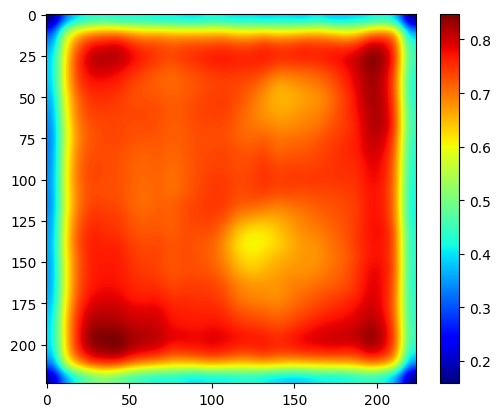

In [80]:
%matplotlib inline
anomaly_map = prediction_grid.get("anomaly_maps")[0]
anomaly_map = anomaly_map.cpu().numpy().squeeze()
plt.imshow(anomaly_map, cmap="jet")  # Use "jet" colormap for better visualization
plt.colorbar()  # Optional: Adds a color scale
plt.show()  # Displays the image properly

In [81]:
print(anomaly_map.shape, image.shape)
if len(anomaly_map.shape) == 2:  # If grayscale (H, W)
    anomaly_map = cv2.cvtColor(anomaly_map, cv2.COLOR_GRAY2BGR)  # Convert to (H, W, 3)

if len(image.shape) == 2:  # If grayscale (H, W)
    image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)  # Convert to (H, W, 3)

anomaly_map = (anomaly_map - anomaly_map.min()) / (anomaly_map.max() - anomaly_map.min()) * 255
anomaly_map = anomaly_map.astype(np.uint8)

(224, 224) (224, 224)


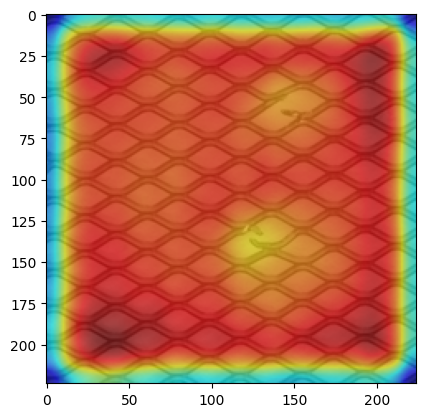

In [82]:
heat_map = superimpose_anomaly_map(anomaly_map=anomaly_map, image=image, normalize=True, alpha=0.6, gamma=0.3)
plt.imshow(heat_map)

In [83]:
pred_score = prediction_grid.get("pred_scores")[0]
pred_labels = prediction_grid.get("pred_labels")[0]
print(pred_score, pred_labels)

tensor(0.6813) tensor(True)


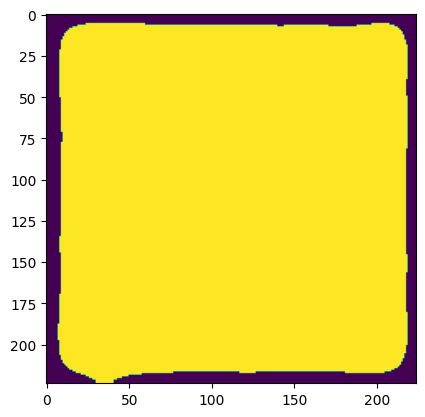

In [84]:
pred_masks = prediction_grid.get("pred_masks")[0].squeeze().cpu().numpy()
plt.imshow(pred_masks)

## Efficient AD

In [86]:
## Efficient AD

EfficientAd??

Init signature:
EfficientAd(
    imagenet_dir: pathlib.Path | str = './datasets/imagenette',
    teacher_out_channels: int = 384,
    model_size: anomalib.models.image.efficient_ad.torch_model.EfficientAdModelSize | str = <EfficientAdModelSize.S: 'small'>,
    lr: float = 0.0001,
    weight_decay: float = 1e-05,
    padding: bool = False,
    pad_maps: bool = True,
) -> None
Source:        
class EfficientAd(AnomalyModule):
    """PL Lightning Module for the EfficientAd algorithm.

    Args:
        imagenet_dir (Path|str): directory path for the Imagenet dataset
            Defaults to ``./datasets/imagenette``.
        teacher_out_channels (int): number of convolution output channels
            Defaults to ``384``.
        model_size (str): size of student and teacher model
            Defaults to ``EfficientAdModelSize.S``.
        lr (float): learning rate
            Defaults to ``0.0001``.
        weight_decay (float): optimizer weight decay
            Defaults to ``0.00001``.


In [87]:
ead_datamodules = []
for category in categories:
    ead_datamodule = MVTec(
        root=dataset_root,
        category=category,
        train_batch_size=1,
        eval_batch_size=1,
        num_workers=0,
        image_size=(256, 256)
    )
    ead_datamodules.append(ead_datamodule)

In [88]:
ead_models = []

for category in categories:
    ead_model = EfficientAd(
        # teacher_out_channels=384,
        # model_size="s",
        # lr=1e-4
        imagenet_dir=f"datasets/{category}"
    )
    ead_models.append(ead_model)

INFO:anomalib.models.components.base.anomaly_module:Initializing EfficientAd model.
INFO:anomalib.models.components.base.anomaly_module:Initializing EfficientAd model.
INFO:anomalib.models.components.base.anomaly_module:Initializing EfficientAd model.


In [89]:
callbacks = [
    
    EarlyStopping(
        monitor="pixel_AUROC",
        mode="max",
        patience=3,
    ),
    ModelCheckpoint(
        dirpath="Assignment-2/checkpoints/EAD",
        filename="best",
        monitor="pixel_AUROC"
    )
]

ead_engines= []
for i in range(0, len(categories)):
    ead_engine = Engine(
        callbacks=callbacks,
        accelerator="auto",  # Automatically detect GPU/CPU
        devices=1,  # Number of devices to use
        logger=False,
        max_epochs=1
    )
    ead_engines.append(ead_engine)


In [90]:
for i in range(0, len(categories)): 
    print(f"For Category: {categories[i]}")
    ead_engines[i].fit(datamodule=ead_datamodules[i], model=ead_models[i])

GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
INFO:anomalib.data.image.mvtec:Found the dataset.


For Category: leather


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/swooshie/Desktop/User/Aditya/NYU/Semester/Spring-2025/CS-GY-6613/project/Artificial-Intelligence-Project/Assignment-2/Assignment-2/checkpoints/EAD exists and is not empty.

  | Name                  | Type                     | Params | Mode 
---------------------------------------------------------------------------
0 | model                 | EfficientAdModel         | 8.1 M  | train
1 | _transform            | Compose                  | 0      | train
2 | normalization_metrics | MetricCollection         | 0      | train
3 | image_threshold       | F1AdaptiveThreshold      | 0      | train
4 | pixel_threshold       | F1AdaptiveThreshold      | 0      | train
5 | image_metrics         | AnomalibMetricCollection | 0      | train
6 | pixel_metrics         | AnomalibMetricCollection | 0      | train
------------------------------

Training: |          | 0/? [00:00<?, ?it/s]

INFO:anomalib.models.image.efficient_ad.lightning_model:Load pretrained teacher model from pre_trained/efficientad_pretrained_weights/pretrained_teacher_small.pth
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(
Calculate teacher channel mean & std: 100%|██████████| 245/245 [00:12<00:00, 19.63it/s]


Epoch 0:   0%|          | 0/245 [00:00<?, ?it/s] 

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/core/module.py:512: You called `self.log('train_st', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/core/module.py:512: You called `self.log('train_ae', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/core/module.py:512: You called `self.log('train_stae', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/core/module.py:512: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable 

Epoch 0: 100%|██████████| 245/245 [00:59<00:00,  4.08it/s, train_st_step=6.620, train_ae_step=5.580, train_stae_step=0.152, train_loss_step=12.40]   

INFO:anomalib.models.image.efficient_ad.lightning_model:Calculate Validation Dataset Quantiles
Calculate Validation Dataset Quantiles: 100%|██████████| 124/124 [00:06<00:00, 19.39it/s]


Epoch 0: 100%|██████████| 245/245 [01:17<00:00,  3.16it/s, train_st_step=6.620, train_ae_step=5.580, train_stae_step=0.152, train_loss_step=12.40, pixel_AUROC=0.928, pixel_F1Score=0.0709, train_st_epoch=9.810, train_ae_epoch=2.500, train_stae_epoch=0.0386, train_loss_epoch=12.30]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 245/245 [01:17<00:00,  3.14it/s, train_st_step=6.620, train_ae_step=5.580, train_stae_step=0.152, train_loss_step=12.40, pixel_AUROC=0.928, pixel_F1Score=0.0709, train_st_epoch=9.810, train_ae_epoch=2.500, train_stae_epoch=0.0386, train_loss_epoch=12.30]

INFO:anomalib.callbacks.timer:Training took 91.18 seconds
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
INFO:anomalib.data.image.mvtec:Found the dataset.
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/swooshie/Desktop/User/Aditya/NYU/Semester/Spring-2025/CS-GY-6613/project/Artificial-Intelligence-Project/Assignment-2/Assignment-2/checkpoints/EAD exists and is not empty.

  | Name                  | Type                     | Params | Mode 
---------------------------------------------------------------------------
0 | model                 | EfficientAdModel         | 8.1 M  | train
1 | _transform            | Compose                  | 0      | train
2 | normalization_metrics | MetricCollection         | 0      | train
3 | image_threshold       | F1AdaptiveThreshold      | 0      | train
4 | pixel_thresho


For Category: tile
Training: |          | 0/? [00:00<?, ?it/s]

INFO:anomalib.models.image.efficient_ad.lightning_model:Load pretrained teacher model from pre_trained/efficientad_pretrained_weights/pretrained_teacher_small.pth
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(
Calculate teacher channel mean & std: 100%|██████████| 230/230 [00:06<00:00, 36.36it/s]

Epoch 0:   0%|          | 0/230 [00:00<?, ?it/s] 

Epoch 0:   0%|          | 1/230 [00:00<03:33,  1.07it/s, train_st_step=16.00, train_ae_step=0.962, train_stae_step=0.00122, train_loss_step=17.00]

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/core/module.py:512: You called `self.log('train_st', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/core/module.py:512: You called `self.log('train_ae', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/core/module.py:512: You called `self.log('train_stae', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/core/module.py:512: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable 

Epoch 0: 100%|██████████| 230/230 [00:46<00:00,  4.91it/s, train_st_step=10.60, train_ae_step=0.909, train_stae_step=0.000789, train_loss_step=11.50]

INFO:anomalib.models.image.efficient_ad.lightning_model:Calculate Validation Dataset Quantiles
Calculate Validation Dataset Quantiles: 100%|██████████| 117/117 [00:04<00:00, 28.42it/s]


Epoch 0: 100%|██████████| 230/230 [00:59<00:00,  3.85it/s, train_st_step=10.60, train_ae_step=0.909, train_stae_step=0.000789, train_loss_step=11.50, pixel_AUROC=0.770, pixel_F1Score=0.430, train_st_epoch=12.80, train_ae_epoch=1.010, train_stae_epoch=0.000874, train_loss_epoch=13.80]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 230/230 [00:59<00:00,  3.84it/s, train_st_step=10.60, train_ae_step=0.909, train_stae_step=0.000789, train_loss_step=11.50, pixel_AUROC=0.770, pixel_F1Score=0.430, train_st_epoch=12.80, train_ae_epoch=1.010, train_stae_epoch=0.000874, train_loss_epoch=13.80]

INFO:anomalib.callbacks.timer:Training took 66.55 seconds
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
INFO:anomalib.data.image.mvtec:Found the dataset.
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:654: Checkpoint directory /Users/swooshie/Desktop/User/Aditya/NYU/Semester/Spring-2025/CS-GY-6613/project/Artificial-Intelligence-Project/Assignment-2/Assignment-2/checkpoints/EAD exists and is not empty.

  | Name                  | Type                     | Params | Mode 
---------------------------------------------------------------------------
0 | model                 | EfficientAdModel         | 8.1 M  | train
1 | _transform            | Compose                  | 0      | train
2 | normalization_metrics | MetricCollection         | 0      | train
3 | image_threshold       | F1AdaptiveThreshold      | 0      | train
4 | pixel_thresho


For Category: grid
Training: |          | 0/? [00:00<?, ?it/s]

INFO:anomalib.models.image.efficient_ad.lightning_model:Load pretrained teacher model from pre_trained/efficientad_pretrained_weights/pretrained_teacher_small.pth
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(
Calculate teacher channel mean & std: 100%|██████████| 264/264 [00:04<00:00, 53.79it/s]

Epoch 0:   0%|          | 0/264 [00:00<?, ?it/s] 

Epoch 0:   0%|          | 1/264 [00:00<02:50,  1.54it/s, train_st_step=15.00, train_ae_step=0.976, train_stae_step=0.00116, train_loss_step=16.00]

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/core/module.py:512: You called `self.log('train_st', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/core/module.py:512: You called `self.log('train_ae', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/core/module.py:512: You called `self.log('train_stae', ..., logger=True)` but have no logger configured. You can enable one by doing `Trainer(logger=ALogger(...))`
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/core/module.py:512: You called `self.log('train_loss', ..., logger=True)` but have no logger configured. You can enable 

Epoch 0: 100%|██████████| 264/264 [00:50<00:00,  5.18it/s, train_st_step=8.390, train_ae_step=1.010, train_stae_step=0.00147, train_loss_step=9.400] 

INFO:anomalib.models.image.efficient_ad.lightning_model:Calculate Validation Dataset Quantiles
Calculate Validation Dataset Quantiles: 100%|██████████| 78/78 [00:02<00:00, 37.42it/s]


Validation DataLoader 0:   0%|          | 0/78 [00:00<?, ?it/s]

Epoch 0: 100%|██████████| 264/264 [00:58<00:00,  4.54it/s, train_st_step=8.390, train_ae_step=1.010, train_stae_step=0.00147, train_loss_step=9.400, pixel_AUROC=0.842, pixel_F1Score=0.0823, train_st_epoch=9.860, train_ae_epoch=1.010, train_stae_epoch=0.00147, train_loss_epoch=10.90]

`Trainer.fit` stopped: `max_epochs=1` reached.


Epoch 0: 100%|██████████| 264/264 [00:58<00:00,  4.52it/s, train_st_step=8.390, train_ae_step=1.010, train_stae_step=0.00147, train_loss_step=9.400, pixel_AUROC=0.842, pixel_F1Score=0.0823, train_st_epoch=9.860, train_ae_epoch=1.010, train_stae_epoch=0.00147, train_loss_epoch=10.90]

INFO:anomalib.callbacks.timer:Training took 63.48 seconds


In [91]:
# ead_engine.test(datamodule=ead_datamodule, model=ead_model, ckpt_path="Assignment-2/checkpoints/EAD/best.ckpt")
for i in range(0, len(categories)):
    ead_engines[i].test(datamodule=ead_datamodules[i], model=ead_models[i])

INFO:anomalib.data.image.mvtec:Found the dataset.
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'test_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


Testing DataLoader 0: 100%|██████████| 124/124 [00:34<00:00,  3.60it/s]

INFO:anomalib.callbacks.timer:Testing took 35.017627000808716 seconds
Throughput (batch_size=1) : 3.5410737568578328 FPS


Testing DataLoader 0: 100%|██████████| 124/124 [00:34<00:00,  3.55it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │         0.9296875         │
│       image_F1Score       │    0.9166666865348816     │
│        pixel_AUROC        │    0.9282287359237671     │
│       pixel_F1Score       │    0.29855450987815857    │
└───────────────────────────┴───────────────────────────┘

INFO:anomalib.data.image.mvtec:Found the dataset.


Testing DataLoader 0: 100%|██████████| 117/117 [00:30<00:00,  3.81it/s]

INFO:anomalib.callbacks.timer:Testing took 31.14932894706726 seconds
Throughput (batch_size=1) : 3.7561001779146084 FPS


Testing DataLoader 0: 100%|██████████| 117/117 [00:31<00:00,  3.76it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.9473304152488708     │
│       image_F1Score       │    0.9142857193946838     │
│        pixel_AUROC        │    0.7700062394142151     │
│       pixel_F1Score       │    0.5282307863235474     │
└───────────────────────────┴───────────────────────────┘

INFO:anomalib.data.image.mvtec:Found the dataset.


Testing DataLoader 0: 100%|██████████| 78/78 [00:19<00:00,  4.03it/s]

INFO:anomalib.callbacks.timer:Testing took 19.74469780921936 seconds
Throughput (batch_size=1) : 3.9504276415706694 FPS


Testing DataLoader 0: 100%|██████████| 78/78 [00:19<00:00,  3.95it/s]


┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│        image_AUROC        │    0.9707602262496948     │
│       image_F1Score       │    0.9473684430122375     │
│        pixel_AUROC        │    0.8420578837394714     │
│       pixel_F1Score       │    0.31658440828323364    │
└───────────────────────────┴───────────────────────────┘

#### Above can be seen the AUROC scores using EAD

In [92]:
ead_predictions = []
for i in range(0, len(categories)):
    path_image = None
    if i == 0:
        path_image = "datasets/MVTec/leather/test/fold/000.png"
    elif i == 1:
        path_image = "datasets/MVTec/tile/test/crack/000.png"
    else:
        path_image = "datasets/MVTec/grid/test/broken/000.png"
    predictions = ead_engines[i].predict(
        model=ead_models[i],
        dataset=PredictDataset(
            path=Path(path_image),
            image_size=(256, 256),
        )
    )
    ead_predictions.append(predictions)

INFO:anomalib.data.image.mvtec:Found the dataset.
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:425: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=10` in the `DataLoader` to improve performance.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.24it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.58it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]


In [93]:
ead_pred_leather = ead_predictions[0]
ead_pred_tile = ead_predictions[1]
ead_pred_grid = ead_predictions[2]

#### Leather Prediction

In [94]:
prediction_ead_leather = ead_pred_leather[0]
prediction_ead_leather

{'image': tensor([[[[0.4451, 0.4411, 0.4832,  ..., 0.5100, 0.3883, 0.4004],
           [0.3530, 0.3890, 0.4221,  ..., 0.4941, 0.4009, 0.3850],
           [0.3850, 0.3949, 0.4474,  ..., 0.4980, 0.4548, 0.4518],
           ...,
           [0.3774, 0.4199, 0.3736,  ..., 0.3523, 0.3310, 0.3325],
           [0.3363, 0.3860, 0.4187,  ..., 0.4194, 0.4120, 0.4251],
           [0.3269, 0.3519, 0.4483,  ..., 0.4141, 0.4049, 0.3806]],
 
          [[0.2798, 0.2784, 0.3054,  ..., 0.3400, 0.2538, 0.2502],
           [0.2238, 0.2469, 0.2711,  ..., 0.3153, 0.2634, 0.2443],
           [0.2525, 0.2600, 0.2970,  ..., 0.3233, 0.3000, 0.2822],
           ...,
           [0.2528, 0.2835, 0.2480,  ..., 0.2310, 0.2171, 0.2134],
           [0.2294, 0.2666, 0.2821,  ..., 0.2795, 0.2683, 0.2764],
           [0.2215, 0.2418, 0.3028,  ..., 0.2749, 0.2696, 0.2523]],
 
          [[0.2305, 0.2262, 0.2458,  ..., 0.2810, 0.2163, 0.2107],
           [0.1915, 0.2037, 0.2203,  ..., 0.2553, 0.2237, 0.2048],
           [0.2

In [95]:
pred_score = prediction_ead_leather.get("pred_scores")[0]
pred_labels = prediction_ead_leather.get("pred_labels")[0]
print(pred_score, pred_labels)

tensor(0.7050) tensor(True)


In [96]:
print(
    f"Image Shape: {prediction_ead_leather.get("image").shape},\n"
    f"Anomaly Map Shape: {prediction_ead_leather.get("anomaly_maps").shape}, \n"
    f"Predicted Mask Shape: {prediction_ead_leather.get("pred_masks").shape}",
)

Image Shape: torch.Size([1, 3, 256, 256]),
Anomaly Map Shape: torch.Size([1, 1, 256, 256]), 
Predicted Mask Shape: torch.Size([1, 1, 256, 256])


In [97]:
image_path = prediction_ead_leather.get("image_path")[0]
image_size = prediction_ead_leather.get("image").shape[-2:]
print(image_size)
image = np.array(Image.open(image_path).resize(image_size))

torch.Size([256, 256])


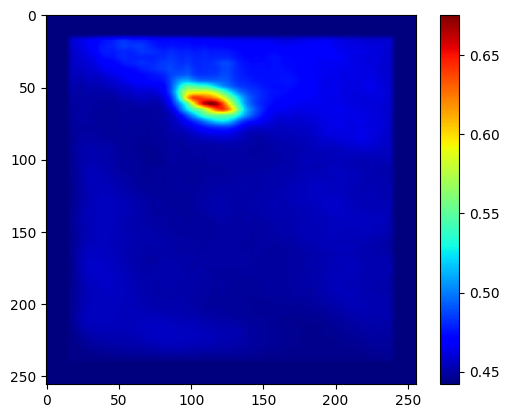

In [98]:
%matplotlib inline
anomaly_map = prediction_ead_leather.get("anomaly_maps")[0]
anomaly_map = anomaly_map.cpu().numpy().squeeze()
plt.imshow(anomaly_map, cmap="jet")  # Use "jet" colormap for better visualization
plt.colorbar()  # Optional: Adds a color scale
plt.show()  # Displays the image properly

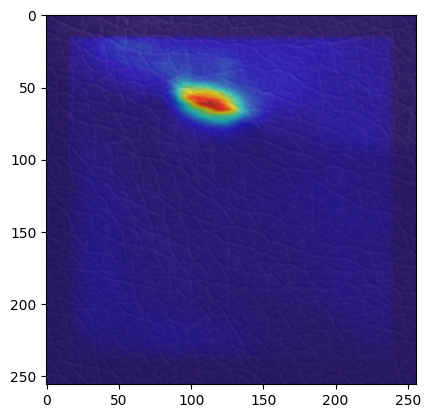

In [99]:
heat_map = superimpose_anomaly_map(anomaly_map=anomaly_map, image=image, normalize=True, alpha=0.6, gamma=0.3)
plt.imshow(heat_map)

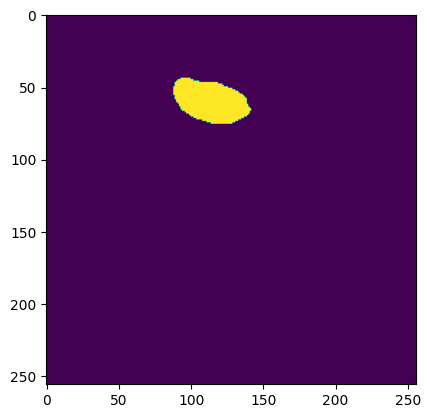

In [100]:
pred_masks = prediction_ead_leather.get("pred_masks")[0].squeeze().cpu().numpy()
plt.imshow(pred_masks)

#### Tile Prediction

In [101]:
prediction_ead_tile = ead_pred_tile[0]
prediction_ead_tile

{'image': tensor([[[[0.6389, 0.6381, 0.6654,  ..., 0.5483, 0.5483, 0.5379],
           [0.5291, 0.5465, 0.6230,  ..., 0.5849, 0.5946, 0.5543],
           [0.4249, 0.4211, 0.4913,  ..., 0.5911, 0.5909, 0.5525],
           ...,
           [0.4566, 0.4314, 0.4287,  ..., 0.3047, 0.2900, 0.2780],
           [0.5001, 0.5087, 0.4971,  ..., 0.2849, 0.2714, 0.2526],
           [0.4733, 0.4878, 0.4800,  ..., 0.2853, 0.2814, 0.2419]],
 
          [[0.6285, 0.6332, 0.6660,  ..., 0.5663, 0.5581, 0.5389],
           [0.5081, 0.5306, 0.6075,  ..., 0.5980, 0.5948, 0.5682],
           [0.4094, 0.3904, 0.4655,  ..., 0.6135, 0.6024, 0.5686],
           ...,
           [0.4627, 0.4367, 0.4474,  ..., 0.2935, 0.2878, 0.2746],
           [0.5108, 0.5066, 0.5097,  ..., 0.2776, 0.2698, 0.2438],
           [0.4870, 0.4844, 0.4858,  ..., 0.2847, 0.2770, 0.2277]],
 
          [[0.6194, 0.6222, 0.6360,  ..., 0.5475, 0.5275, 0.5086],
           [0.5139, 0.5221, 0.5913,  ..., 0.5759, 0.5706, 0.5410],
           [0.4

In [102]:
pred_score = prediction_ead_tile.get("pred_scores")[0]
pred_labels = prediction_ead_tile.get("pred_labels")[0]
print(pred_score, pred_labels)

tensor(0.5171) tensor(True)


In [103]:
image_path = prediction_ead_tile.get("image_path")[0]
image_size = prediction_ead_tile.get("image").shape[-2:]
print(image_size)
image = np.array(Image.open(image_path).resize(image_size))

torch.Size([256, 256])


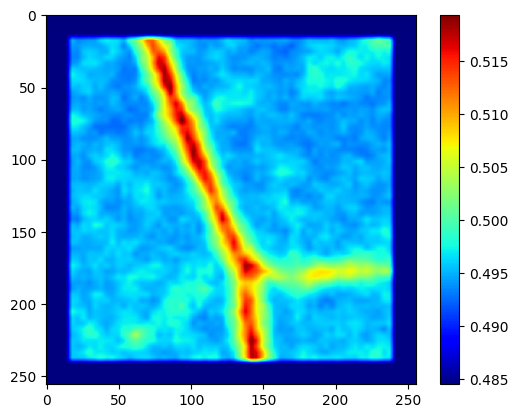

In [104]:
%matplotlib inline
anomaly_map = prediction_ead_tile.get("anomaly_maps")[0]
anomaly_map = anomaly_map.cpu().numpy().squeeze()
plt.imshow(anomaly_map, cmap="jet")  # Use "jet" colormap for better visualization
plt.colorbar()  # Optional: Adds a color scale
plt.show()  # Displays the image properly

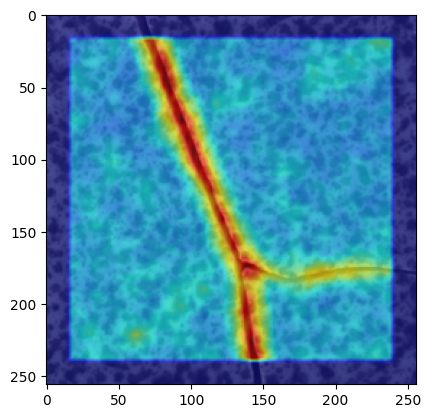

In [105]:
heat_map = superimpose_anomaly_map(anomaly_map=anomaly_map, image=image, normalize=True, alpha=0.6, gamma=0.3)
plt.imshow(heat_map)

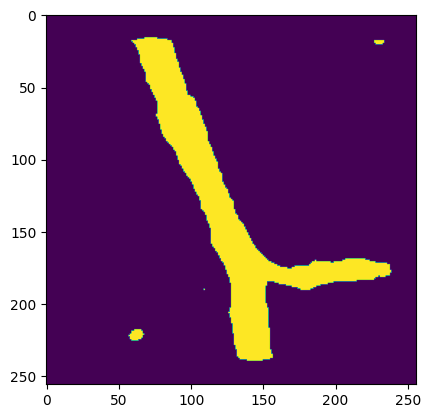

In [106]:
pred_masks = prediction_ead_tile.get("pred_masks")[0].squeeze().cpu().numpy()
plt.imshow(pred_masks)

#### Grid Prediction

In [107]:
prediction_ead_grid = ead_pred_grid[0]
prediction_ead_grid

{'image': tensor([[[[0.4030, 0.4333, 0.4349,  ..., 0.3170, 0.3443, 0.3868],
           [0.2356, 0.2764, 0.3118,  ..., 0.3731, 0.3927, 0.4182],
           [0.2636, 0.2412, 0.2160,  ..., 0.4012, 0.3941, 0.3524],
           ...,
           [0.2290, 0.2374, 0.2550,  ..., 0.3781, 0.3517, 0.2811],
           [0.2603, 0.3057, 0.3756,  ..., 0.3078, 0.2497, 0.2447],
           [0.3368, 0.3842, 0.4270,  ..., 0.2243, 0.2746, 0.4116]],
 
          [[0.4030, 0.4333, 0.4349,  ..., 0.3170, 0.3443, 0.3868],
           [0.2356, 0.2764, 0.3118,  ..., 0.3731, 0.3927, 0.4182],
           [0.2636, 0.2412, 0.2160,  ..., 0.4012, 0.3941, 0.3524],
           ...,
           [0.2290, 0.2374, 0.2550,  ..., 0.3781, 0.3517, 0.2811],
           [0.2603, 0.3057, 0.3756,  ..., 0.3078, 0.2497, 0.2447],
           [0.3368, 0.3842, 0.4270,  ..., 0.2243, 0.2746, 0.4116]],
 
          [[0.4030, 0.4333, 0.4349,  ..., 0.3170, 0.3443, 0.3868],
           [0.2356, 0.2764, 0.3118,  ..., 0.3731, 0.3927, 0.4182],
           [0.2

In [108]:
pred_score = prediction_ead_grid.get("pred_scores")[0]
pred_labels = prediction_ead_grid.get("pred_labels")[0]
print(pred_score, pred_labels)

tensor(1.) tensor(True)


In [109]:
image_path = prediction_ead_grid.get("image_path")[0]
image_size = prediction_ead_grid.get("image").shape[-2:]
print(image_size)
image = np.array(Image.open(image_path).resize(image_size))

torch.Size([256, 256])


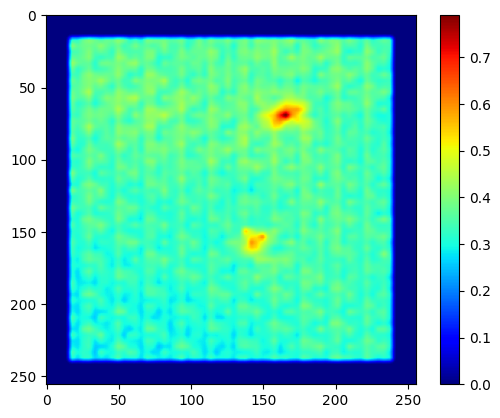

In [110]:
%matplotlib inline
anomaly_map = prediction_ead_grid.get("anomaly_maps")[0]
anomaly_map = anomaly_map.cpu().numpy().squeeze()
plt.imshow(anomaly_map, cmap="jet")  # Use "jet" colormap for better visualization
plt.colorbar()  # Optional: Adds a color scale
plt.show()  # Displays the image properly

(256, 256) (256, 256)


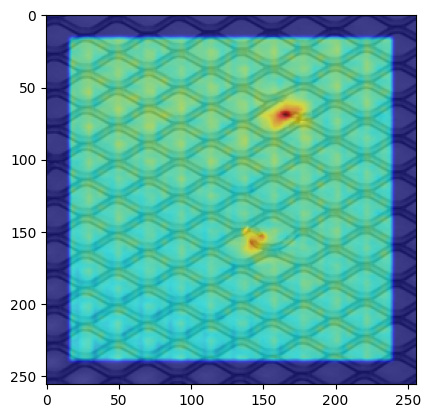

In [111]:
print(anomaly_map.shape, image.shape)
if len(anomaly_map.shape) == 2:  # If grayscale (H, W)
    anomaly_map = cv2.cvtColor(anomaly_map, cv2.COLOR_GRAY2BGR)  # Convert to (H, W, 3)

if len(image.shape) == 2:  # If grayscale (H, W)
    image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)  # Convert to (H, W, 3)

anomaly_map = (anomaly_map - anomaly_map.min()) / (anomaly_map.max() - anomaly_map.min()) * 255
anomaly_map = anomaly_map.astype(np.uint8)

heat_map = superimpose_anomaly_map(anomaly_map=anomaly_map, image=image, normalize=True, alpha=0.6, gamma=0.3)
plt.imshow(heat_map)

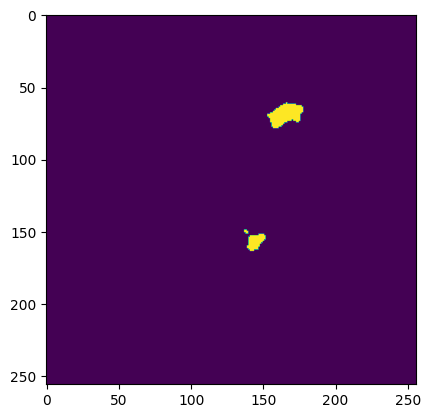

In [112]:
pred_masks = prediction_ead_grid.get("pred_masks")[0].squeeze().cpu().numpy()
plt.imshow(pred_masks)

# Similarity Search

In [117]:
import torch

from qdrant_client import QdrantClient
from qdrant_client.models import CollectionConfig, VectorParams, Distance
from qdrant_client.models import PointStruct
import numpy as np
import torchvision.transforms as transforms
import torch.nn as nn
import torchvision.models as models
import uuid
import random
from PIL import Image

from sklearn.decomposition import PCA

pca = PCA(n_components=512)

# Initialize Qdrant
client = QdrantClient(":memory:")  # Use persistent storage if needed

### Defining pre-trained RESNET for feature extraction after predicting the anomaly mask of the input image

In [118]:
# Load a pretrained ResNet-18 model
model_rs = models.resnet18(pretrained=True)

# Remove the final classification layer to get feature vectors
model_rs = nn.Sequential(*list(model_rs.children())[:-1])
model_rs.eval()  # Set model to evaluation mode

# Define image transformation (ResNet expects 224x224 input)
def transform_fe(image):
    # Ensure the image is in RGB mode
    if image.mode != 'RGB':
        image = image.convert('RGB')
    
    # Apply any necessary transformations like resizing, normalization, etc.
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    return transform(image)

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


#### Function to extract features from anomaly mask

In [119]:
def extract_features(engine, model, image_tensor, image_file):
    prediction= engine.predict(model=model, data_path=image_file)[0]
    anomaly_map = prediction.get("anomaly_maps")[0]
    anomaly_map = anomaly_map.cpu().numpy().squeeze()

    with torch.no_grad():
        anomaly_map_pil = Image.fromarray((anomaly_map * 255).astype('uint8')).convert("RGB") 
        print(anomaly_map_pil.size) # Ensure correct format
        features = model_rs(transform_fe(anomaly_map_pil).unsqueeze(0))  # Extract features # Extract features
    features = features.cpu().numpy().squeeze()
    return features
    

#### Function to create a collection

In [120]:
# Create a collection
def create_collection_function(collection_name):
    if(not client.collection_exists(collection_name)):
        print(f"Creating... {collection_name}")
        client.create_collection(collection_name, vectors_config=VectorParams(size=512, distance=Distance.COSINE))  # Adjust size if needed
    else:
        print(f"No need for creation, collection {collection_name} already exists")

In [121]:
def get_images_from_folder(folderPath):
    paths = []
    pathlist = Path(folderPath).glob('**/*.png')
    for path in pathlist:
        path_in_str = str(path) 
        paths.append(path_in_str)
    good = list(map(lambda x: 'train' in x, paths))
    bad = list(map(lambda x: 'test' in x and 'good' not in x, paths))
    good_imgs = [s for s, f in zip(paths, good) if f]
    bad_imgs = [s for s, f in zip(paths, bad) if f]
    random.shuffle(good_imgs)
    random.shuffle(bad_imgs)
    paths = []
    paths.extend(good_imgs[:50])
    paths.extend(bad_imgs[:50])
    return paths  

In [122]:
# create_collection_function("leather")

for category in categories:
    client.delete_collection(collection_name=f"patchcore-{categories[i]}")

In [123]:
for category in categories:
    client.delete_collection(collection_name=f"ead-{categories[i]}")

#### Make sample data for collections, 50 good and 50 bad images of each category in the respective collection

In [124]:
leather_images = get_images_from_folder(dataset_root / "leather")
leather_images
tile_images = get_images_from_folder(dataset_root / "tile")
grid_images = get_images_from_folder(dataset_root / "grid")

images_dict = {
    0: leather_images,
    1: tile_images,
    2: grid_images
}

#### Function to upload feature vectors to Qdrant

In [125]:
def upload_features_to_qdrant(engine, image_files, collection_name, model):
    print(type(image_files))
    create_collection_function(collection_name=collection_name)
    points = []
    i = 0
    for idx, image_file in enumerate(image_files):
        image = Image.open(image_files[i])
        features = extract_features(engine, model, transform_fe(image), image_file)
        points.append(
            PointStruct(
                id=idx,
                vector=features.tolist(),
                payload={"filename": image_file}
            )
        )
        # if i == 10:
        #     break
        i+=1
        if(i%50==0):
            print(i)

    # Upload vectors to Qdrant
    create_collection_function(collection_name=collection_name)
    client.upsert(collection_name=collection_name, points=points)
    print(f"Uploaded {len(points)} images to Qdrant collection: {collection_name}")


#### Feature vector collections for Patchcore models

In [126]:
for i in range(0, len(categories)):
    upload_features_to_qdrant(patchcore_engines[i], images_dict.get(i), f"patchcore-{categories[i]}", P_models[i])

INFO:anomalib.data.image.mvtec:Found the dataset.


<class 'list'>
Creating... patchcore-leather
Predicting DataLoader 0: 100%|██████████| 1/1 [00:02<00:00,  0.41it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.81it/s]
(224, 224)


INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.61it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.38it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.48it/s]
(224, 224)


INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]


(224, 224)


INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.03it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.18it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
50
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.38it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.58it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.98it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.90it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.83it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.24it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.73it/s]
(224, 224)


INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.53it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.93it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]
(224, 224)


INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.88it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
100
No need for creation, collection patchcore-leather already exists
Uploaded 100 images to Qdrant collection: patchcore-leather
<class 'list'>
Creating... patchcore-tile
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.47it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.37it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.42it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.68it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.34it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.61it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
50
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.81it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.42it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.17it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.99it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.39it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.08it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.13it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.44it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.43it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.84it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.45it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.23it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.31it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
100
No need for creation, collection patchcore-tile already exists
Uploaded 100 images to Qdrant collection: patchcore-tile
<class 'list'>
Creating... patchcore-grid
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.35it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.02it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.38it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.67it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.48it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.56it/s]


(224, 224)


INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.25it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
50
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.95it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.21it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.75it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.30it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.31it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.03it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.33it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(224, 224)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.24it/s]
(224, 224)
100
No need for creation, collection patchcore-grid already exists
Uploaded 100 images to Qdrant collection: patchcore-grid


#### Feature vector collections for EAD models

In [127]:
for i in range(0, len(categories)):
    upload_features_to_qdrant(ead_engines[i], images_dict.get(i), f"ead-{categories[i]}", ead_models[i])

INFO:anomalib.data.image.mvtec:Found the dataset.


<class 'list'>
Creating... ead-leather
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.60it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.07it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.10it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.05it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.89it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.99it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.10it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.65it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.04it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.49it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.16it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.27it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.94it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.99it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.43it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.78it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
50
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.80it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.24it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.69it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.62it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.09it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.01it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.85it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.99it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.93it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.40it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
100
No need for creation, collection ead-leather already exists
Uploaded 100 images to Qdrant collection: ead-leather
<class 'list'>
Creating... ead-tile
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.52it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.79it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.36it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.22it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.68it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.19it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.70it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.76it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.02it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.94it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.20it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.18it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.34it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.47it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.19it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.21it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.06it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.50it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.63it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.87it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.87it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.28it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.61it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.51it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.36it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.15it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.74it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
50
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.90it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.80it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.59it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.12it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.13it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.96it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.37it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.29it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.13it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.64it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.71it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.41it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.44it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.41it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.61it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.02it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.20it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.94it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.60it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.70it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.11it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.98it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.88it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.89it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.25it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.21it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.48it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
100
No need for creation, collection ead-tile already exists
Uploaded 100 images to Qdrant collection: ead-tile
<class 'list'>
Creating... ead-grid
Predicting DataLoader 0: 100%|██████████| 1/1 [00:01<00:00,  0.96it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.85it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  3.84it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.91it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.95it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.03it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:01<00:00,  0.52it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.06it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.90it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.06it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.98it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.19it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.73it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.00it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.27it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.13it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.11it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.54it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.21it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.23it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
50
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.71it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.74it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.83it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.47it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.39it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.55it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.37it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.51it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.28it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.13it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.99it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.14it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.91it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.40it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.79it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.34it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.11it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.01it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.84it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.26it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.77it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.15it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  6.10it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.32it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.73it/s]
(256, 256)
100
No need for creation, collection ead-grid already exists
Uploaded 100 images to Qdrant collection: ead-grid


#### Function to find similar images

In [128]:
def find_similar_images(engine, query_image_tensor, collection_name, model, image_file, top_k=5):
    vector = extract_features(engine, model, query_image_tensor, image_file)
    print(vector.shape)
    results = client.query_points(
        collection_name=collection_name,
        query=vector,
        limit=top_k
    )
    return results

#### Trial functions to test the above functionalities

In [136]:
img_path = leather_images[-1]
print(img_path)

# image = cv2.imread(img_path)

# # Convert BGR image to RGB image
# image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

image = Image.open(img_path)

# similar_images = find_similar_images(patchcore_engines[0], image, "patchcore-tile", P_models[0], img_path)
similar_images = find_similar_images(ead_engines[0], image, "ead-leather", ead_models[0], img_path, 5)

INFO:anomalib.data.image.mvtec:Found the dataset.


/Users/swooshie/Desktop/User/Aditya/NYU/Semester/Spring-2025/CS-GY-6613/datasets/MVTec/leather/test/glue/013.png
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.04it/s]
(256, 256)
(512,)


In [137]:
similar_images.points

[ScoredPoint(id=99, version=0, score=1.0000000067818953, payload={'filename': '/Users/swooshie/Desktop/User/Aditya/NYU/Semester/Spring-2025/CS-GY-6613/datasets/MVTec/leather/test/glue/013.png'}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=73, version=0, score=0.9510802299813006, payload={'filename': '/Users/swooshie/Desktop/User/Aditya/NYU/Semester/Spring-2025/CS-GY-6613/datasets/MVTec/leather/test/glue/014.png'}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=82, version=0, score=0.9444636694252346, payload={'filename': '/Users/swooshie/Desktop/User/Aditya/NYU/Semester/Spring-2025/CS-GY-6613/datasets/MVTec/leather/test/glue/005.png'}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=84, version=0, score=0.9410847236771622, payload={'filename': '/Users/swooshie/Desktop/User/Aditya/NYU/Semester/Spring-2025/CS-GY-6613/datasets/MVTec/leather/test/poke/014.png'}, vector=None, shard_key=None, order_value=None),
 ScoredPoint(id=90, version=

In [138]:
def plot_images(image_paths):
    fig, axes = plt.subplots(1, 5, figsize=(15, 5))  # 1 row, 5 columns

    for i, img_path in enumerate(image_paths):
        image = cv2.imread(img_path)  # Read image
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        
        axes[i].imshow(image)
        axes[i].axis("off")  # Hide axes
        axes[i].set_title(f"Image {i+1}")

    plt.tight_layout()
    plt.show()

## Original Image

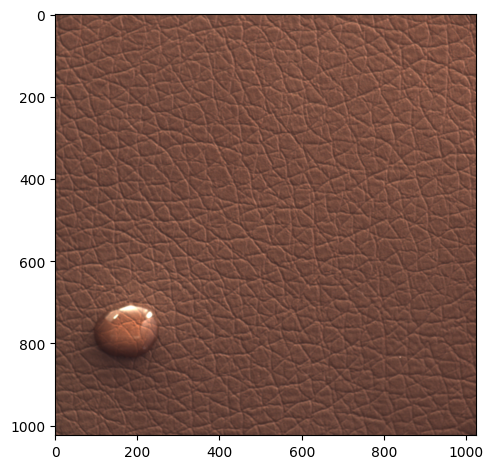

In [139]:
%matplotlib inline
image = cv2.imread(img_path)  # Read image
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
plt.imshow(image)
plt.tight_layout()
plt.show()

## Similar Images

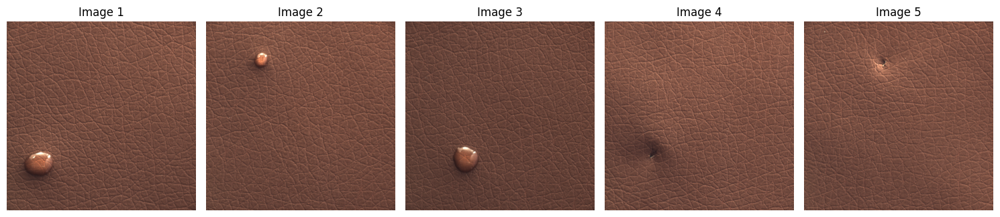

In [140]:
image_paths = []
for i in range(0, 5):
    image_paths.append(similar_images.points[i].payload['filename'])

plot_images(image_paths=image_paths)

In [170]:
images_test = [
    leather_images[0], leather_images[-1], tile_images[2], tile_images[-11], grid_images[10], grid_images[-6]
]
images_test

['/Users/swooshie/Desktop/User/Aditya/NYU/Semester/Spring-2025/CS-GY-6613/datasets/MVTec/leather/train/good/235.png',
 '/Users/swooshie/Desktop/User/Aditya/NYU/Semester/Spring-2025/CS-GY-6613/datasets/MVTec/leather/test/glue/013.png',
 '/Users/swooshie/Desktop/User/Aditya/NYU/Semester/Spring-2025/CS-GY-6613/datasets/MVTec/tile/train/good/095.png',
 '/Users/swooshie/Desktop/User/Aditya/NYU/Semester/Spring-2025/CS-GY-6613/datasets/MVTec/tile/test/crack/016.png',
 '/Users/swooshie/Desktop/User/Aditya/NYU/Semester/Spring-2025/CS-GY-6613/datasets/MVTec/grid/train/good/206.png',
 '/Users/swooshie/Desktop/User/Aditya/NYU/Semester/Spring-2025/CS-GY-6613/datasets/MVTec/grid/test/broken/007.png']

## Using PatchCore Model to find out similar images

INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]
(224, 224)
(512,)


INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]
(224, 224)
(512,)


INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.87it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
(512,)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.79it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(224, 224)
(512,)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.03it/s]
(224, 224)
(512,)


INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.05it/s]
(224, 224)
(512,)


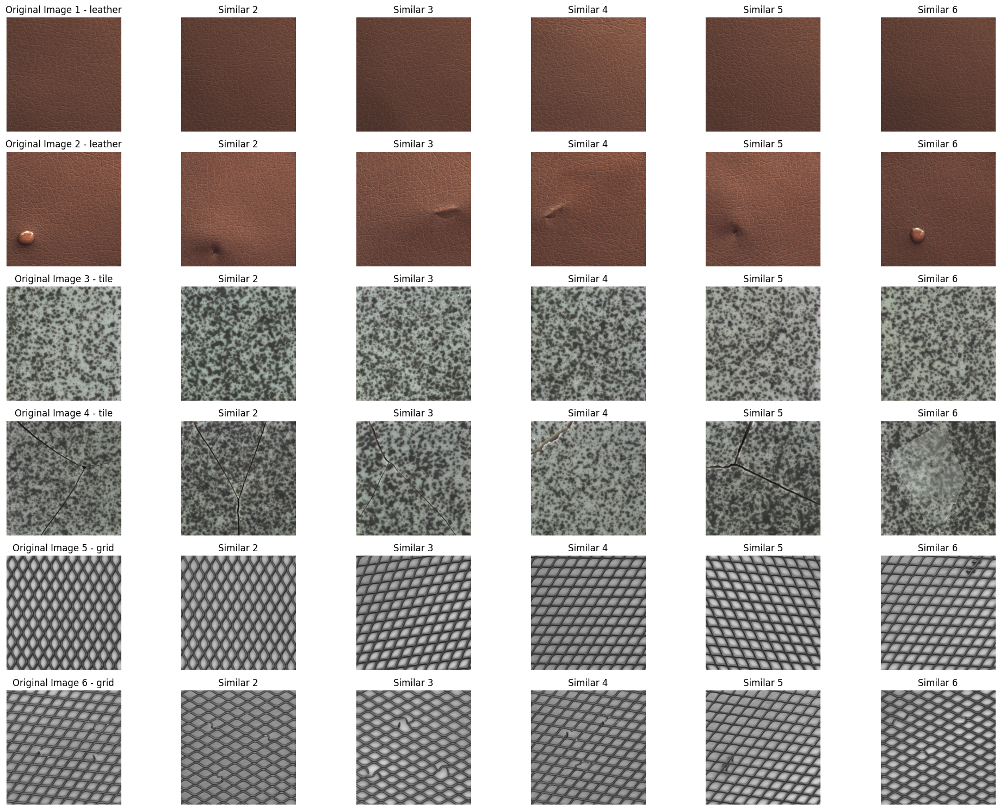

In [171]:
import matplotlib
%matplotlib inline
matplotlib.use('Agg')

n_categories = len(categories)

# Number of rows: 6 rows for 3 categories with 2 images each (3*2 = 6 rows)
n_rows = n_categories * 2  # 2 images per category, so 6 rows for 3 categories

# Number of columns: 6 columns per row (1 for the original and 5 for similar images)
n_cols = 6

# Create the figure with a grid of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

for i in range(n_categories):
    category = categories[i]
    
    for j in range(2):  # 2 test images per category
        idx = i * 2 + j  # Calculate the index for this category's rows
        
        # Read the test image
        image = cv2.imread(images_test[i * 2 + j])  # Read image
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        
        # Display the original image in the first column of the current row
        ax = axes[idx, 0]  # Column 0 for the original image
        ax.imshow(image)
        ax.axis('off')
        ax.set_title(f"Original Image {i*2 + j+1} - {category}")
        
        # Find similar images
        similar_images_pc = find_similar_images(
            patchcore_engines[i],
            Image.open(images_test[i * 2 + j]),
            f"patchcore-{category}",
            P_models[i],
            images_test[i * 2 + j],
            6
        )
        
        # Display the similar images in the next 5 columns for this original image
        for k in range(1, len(similar_images_pc.points)):
            img_path = similar_images_pc.points[k].payload['filename']
            image = cv2.imread(img_path)  # Read similar image
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            
            ax = axes[idx, k]  # Columns 1-5 for the similar images
            ax.imshow(image)
            ax.axis('off')
            ax.set_title(f"Similar {k+1}")
            
# Adjust layout
%matplotlib inline
plt.tight_layout()
plt.show()
    

## Using EAD Model to find similar images

INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]
(256, 256)
(512,)


INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.72it/s]
(256, 256)
(512,)


INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.19it/s]
(256, 256)
(512,)


INFO:anomalib.data.image.mvtec:Found the dataset.


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  4.51it/s]

INFO:anomalib.data.image.mvtec:Found the dataset.



(256, 256)
(512,)


Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


INFO:anomalib.data.image.mvtec:Found the dataset.


(256, 256)
(512,)
Predicting DataLoader 0: 100%|██████████| 1/1 [00:00<00:00,  5.10it/s]
(256, 256)
(512,)


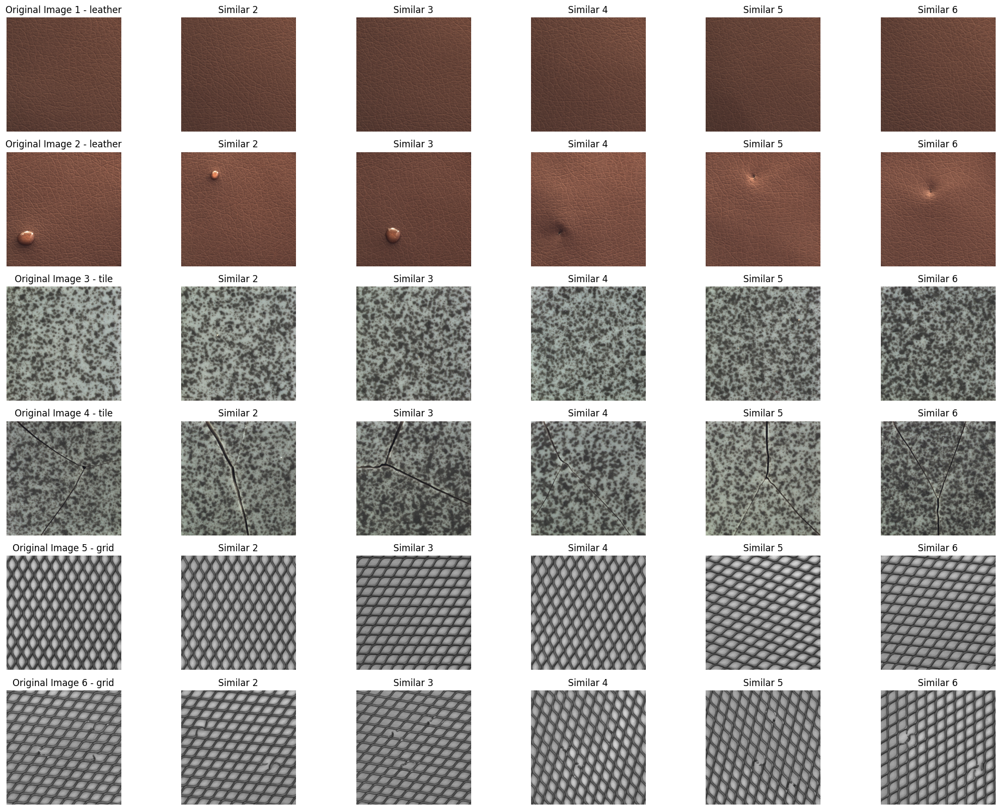

In [172]:
import matplotlib
%matplotlib inline
matplotlib.use('Agg')

n_categories = len(categories)

# Number of rows: 6 rows for 3 categories with 2 images each (3*2 = 6 rows)
n_rows = n_categories * 2  # 2 images per category, so 6 rows for 3 categories

# Number of columns: 6 columns per row (1 for the original and 5 for similar images)
n_cols = 6

# Create the figure with a grid of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 15))

for i in range(n_categories):
    category = categories[i]
    
    for j in range(2):  # 2 test images per category
        idx = i * 2 + j  # Calculate the index for this category's rows
        
        # Read the test image
        image = cv2.imread(images_test[i * 2 + j])  # Read image
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
        
        # Display the original image in the first column of the current row
        ax = axes[idx, 0]  # Column 0 for the original image
        ax.imshow(image)
        ax.axis('off')
        ax.set_title(f"Original Image {i*2 + j+1} - {category}")
        
        # Find similar images
        similar_images_pc = find_similar_images(
            ead_engines[i],
            Image.open(images_test[i * 2 + j]),
            f"ead-{category}",
            ead_models[i],
            images_test[i * 2 + j],
            6
        )
        
        # Display the similar images in the next 5 columns for this original image
        for k in range(1, len(similar_images_pc.points)):
            img_path = similar_images_pc.points[k].payload['filename']
            image = cv2.imread(img_path)  # Read similar image
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB
            
            ax = axes[idx, k]  # Columns 1-5 for the similar images
            ax.imshow(image)
            ax.axis('off')
            ax.set_title(f"Similar {k+1}")
            
# Adjust layout
%matplotlib inline
plt.tight_layout()
plt.show()
    

### Receptive Field Calculation for PDN

To verify that each output neuron in the Patch Description Network (PDN) has a receptive field of **33×33 pixels**, we calculate the receptive field (RF) layer by layer. The formula for the receptive field at layer \( l \) is:

$$
\text{RF}_l = \text{RF}_{l-1} + (k_l - 1) \times \prod_{i=1}^{l-1} s_i
$$

Where:
- $$ \text{RF}_l : \text{Receptive field at layer l} $$
- $$ k_l : \text{Kernel size at layer l} $$
- $$ s_i : \text{Stride at layer i} $$

We start with the input layer, where the receptive field is **1×1**.

---

#### Layer-by-Layer Calculation:

1. **Input Layer**:  
   - RF: 1 * 1

2. **Conv-1**:  
   - Kernel size:  4 
   - Stride: 1  
   - Padding: 3  
   - RF: 1 + (4 - 1) * 1 = 4 

3. **AvgPool-1**:  
   - Kernel size: 2  
   - Stride: 2 
   - Padding: 1
   - RF: 4 + (2 - 1) * 1 = 5
   - Stride multiplier: 1 * 2 = 2

4. **Conv-2**:  
   - Kernel size: 4
   - Stride: 1 
   - Padding: 3 
   - RF: 5 + (4 - 1)*2 = 11

5. **AvgPool-2**:  
   - Kernel size: 2
   - Stride: 2 
   - Padding: 1  
   - RF: 11 + (2 - 1)*2 = 13
   - Stride multiplier:  2 * 2 = 4 

6. **Conv-3**:  
   - Kernel size: 3  
   - Stride: 1  
   - Padding: 1 
   - RF: 13 + (3 - 1)*4 = 21

7. **Conv-4**:  
   - Kernel size: 4  
   - Stride: 1  
   - Padding: 0  
   - RF: 21 + (4 - 1) * 4 = 33

---

### Conclusion:
The receptive field of each output neuron in the final layer (Conv-4) is **33×33 pixels**, which supports the authors' statement. This calculation confirms that the PDN architecture is designed to describe 33×33 patches in the input image.